# 0. Setup Paths

In [1]:
# used for changing directories
import os

### Setting up file paths

In [37]:
# name of my model folder
CUSTOM_MODEL_NAME = 'my_ssdmobnet2_IOU0.5'
# filename from tf model zoo
#ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8
PRETRAINED_MODEL_NAME = 'ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8'
# link to download from tf model zoo
PRETRAINED_MODEL_URL = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz'
TF_RECORD_SCRIPT_NAME = 'generate_tfrecord.py'
XML_SCRIPT_NAME = 'changexml.py'
LABEL_MAP_NAME = 'label_map.pbtxt'

In [38]:
# setting up paths, to be used later
paths = {
    'WORKSPACE_PATH': os.path.join('Tensorflow', 'workspace'),
    'SCRIPTS_PATH': os.path.join('Tensorflow','scripts'),
    'APIMODEL_PATH': os.path.join('Tensorflow','models'),
    'ANNOTATION_PATH': os.path.join('Tensorflow', 'workspace','annotations'),
    'IMAGE_PATH': os.path.join('Tensorflow', 'workspace','images'),
    'MODEL_PATH': os.path.join('Tensorflow', 'workspace','models'),
    'PRETRAINED_MODEL_PATH': os.path.join('Tensorflow', 'workspace','pre-trained-models'),
    'CHECKPOINT_PATH': os.path.join('Tensorflow', 'workspace','models',CUSTOM_MODEL_NAME),
    'OUTPUT_PATH': os.path.join('Tensorflow', 'workspace','models',CUSTOM_MODEL_NAME, 'export'),
    'TFJS_PATH':os.path.join('Tensorflow', 'workspace','models',CUSTOM_MODEL_NAME, 'tfjsexport'),
    'TFLITE_PATH':os.path.join('Tensorflow', 'workspace','models',CUSTOM_MODEL_NAME, 'tfliteexport'),
    'PROTOC_PATH':os.path.join('Tensorflow','protoc')
 }

In [39]:
files = {
    'PIPELINE_CONFIG':os.path.join('Tensorflow', 'workspace','models', CUSTOM_MODEL_NAME, 'pipeline.config'),
    'TF_RECORD_SCRIPT': os.path.join(paths['SCRIPTS_PATH'], TF_RECORD_SCRIPT_NAME),
    'XML_SCRIPT': os.path.join(paths['SCRIPTS_PATH'], XML_SCRIPT_NAME),
    'LABELMAP': os.path.join(paths['ANNOTATION_PATH'], LABEL_MAP_NAME)
}

In [40]:
for path in paths.values():
    if not os.path.exists(path):
        if os.name == 'posix':
            !mkdir -p {path}
        if os.name == 'nt':
            !mkdir {path}

### downloading our dataset

In [6]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="oyuoct1bGTkNznygLZEo")
#project = rf.workspace("uni-awhxd").project("militarycivilian")
#dataset = project.version(2).download("tensorflow")

#project = rf.workspace("comp-1827").project("military-dataset-uwsvk")
#dataset = project.version(3).download("tensorflow")

project = rf.workspace("uni-awhxd").project("military-dataset-vormc")
dataset = project.version(1).download("tensorflow")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.5/68.5 kB 661.2 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 18.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.5/77.5 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.1 MB/s eta 0:00:00
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.8.1.78
    Uninstalling opencv-python-headless-4.8.1.78:
      Successfully uninst

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Military-Dataset-1 in tensorflow:: 100%|██████████| 9780/9780 [00:02<00:00, 3700.40it/s]


moving the test and train image folders into our workspace

In [7]:
%mv /content/Military-Dataset-1/test {paths['IMAGE_PATH']}
%mv /content/Military-Dataset-1/train {paths['IMAGE_PATH']}

# 1. Download TF Models Pretrained Models from Tensorflow Model Zoo and Install TFOD

In [8]:
# https://www.tensorflow.org/install/source_windows

In [9]:
# allows us to get model from tensorflow zoo
if os.name=='nt':
    !pip install wget
    import wget

In [10]:
# download the model from github tensorflow zoo
if not os.path.exists(os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection')):
    !git clone https://github.com/tensorflow/models {paths['APIMODEL_PATH']}

Cloning into 'Tensorflow/models'...
remote: Enumerating objects: 90151, done.
remote: Counting objects: 100% (171/171), done.
remote: Compressing objects: 100% (89/89), done.
remote: Total 90151 (delta 97), reused 146 (delta 79), pack-reused 89980
Receiving objects: 100% (90151/90151), 606.64 MiB | 19.20 MiB/s, done.
Resolving deltas: 100% (64938/64938), done.


In [11]:
# Install Tensorflow Object Detection
# if on mac os
if os.name=='posix':
    !apt-get install protobuf-compiler
    !cd Tensorflow/models/research && protoc object_detection/protos/*.proto --python_out=. && cp object_detection/packages/tf2/setup.py . && python -m pip install .
# if on windows os
if os.name=='nt':
    url="https://github.com/protocolbuffers/protobuf/releases/download/v3.15.6/protoc-3.15.6-win64.zip"
    wget.download(url)
    !move protoc-3.15.6-win64.zip {paths['PROTOC_PATH']}
    !cd {paths['PROTOC_PATH']} && tar -xf protoc-3.15.6-win64.zip
    os.environ['PATH'] += os.pathsep + os.path.abspath(os.path.join(paths['PROTOC_PATH'], 'bin'))
    !cd Tensorflow/models/research && protoc object_detection/protos/*.proto --python_out=. && copy object_detection\\packages\\tf2\\setup.py setup.py && python setup.py build && python setup.py install
    !cd Tensorflow/models/research/slim && pip install -e .

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
protobuf-compiler is already the newest version (3.12.4-1ubuntu7.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 23 not upgraded.
Processing /content/Tensorflow/models/research
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.7/14.7 MB 47.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 37.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.8/28.8 MB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 22.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 3.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 241.2/241.2 kB 26.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━

In [12]:
# the above code installs the newest tensorflow, tf 2.14.0, but that causes an error when training my model
# model only works with tf 2.13.0
#!pip uninstall tensorflow
!pip install tensorflow==2.13.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.1/524.1 MB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 23.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 21.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.8/440.8 kB 14.3 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.15.0
    Uninstalling tensorflow-estimator-2.15.0:
      Successfully uninstalled tensorflow-estimator-2.15.0
  Attempting uninstall: keras
    Found existing installation: keras 2.15.0
    Uninstalling keras-2.15.0:
      Successfully uninstalled keras-2.15.0
  Attempting uninstall: gast
    Found existing installation: gast 0.5.4
    Uninstalling gast-0.5.4:
      Successfully uninstalled gast-0.5.4
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.15.1
    Uninstalling tensorboard-2.15.1:
      Successfully uninstalled tensorboard-2.1

### Verify that we have the correct imports

In [ ]:
VERIFICATION_SCRIPT = os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection', 'builders', 'model_builder_tf2_test.py')
# Verify Installation
# if returns "ok", everythings running well
!python {VERIFICATION_SCRIPT}

### Only run these if verification unsuccessful

In [ ]:
# avoid running this, as training doesnt work with tf 2.14.0
#!pip install tensorflow --upgrade

In [ ]:
#!pip uninstall protobuf matplotlib -y
#!pip install protobuf matplotlib==3.2

In [ ]:
#!pip install pyyaml

In [ ]:
#!pip install kiwisolver

In [ ]:
#!pip install cycler

### downloading the pretrained tensorflow model

In [13]:
import object_detection

In [14]:
#!pip list

In [15]:
#!pip install --upgrade absl-py

In [16]:
# downloading the github repo for the chosen pretrained model (ssd_mobilenet_v2)
if os.name =='posix':
    !wget {PRETRAINED_MODEL_URL}
    !mv {PRETRAINED_MODEL_NAME+'.tar.gz'} {paths['PRETRAINED_MODEL_PATH']}
    !cd {paths['PRETRAINED_MODEL_PATH']} && tar -zxvf {PRETRAINED_MODEL_NAME+'.tar.gz'}
if os.name == 'nt':
    wget.download(PRETRAINED_MODEL_URL)
    !move {PRETRAINED_MODEL_NAME+'.tar.gz'} {paths['PRETRAINED_MODEL_PATH']}
    # untar the file
    !cd {paths['PRETRAINED_MODEL_PATH']} && tar -zxvf {PRETRAINED_MODEL_NAME+'.tar.gz'}

--2023-12-13 12:49:22--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 173.194.74.207, 173.194.192.207, 209.85.145.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|173.194.74.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20518283 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.57M  --.-KB/s    in 0.08s   

2023-12-13 12:49:22 (234 MB/s) - ‘ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz’ saved [20518283/20518283]

ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/
ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/checkpoint/
ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/checkpoint/checkpoint
ssd_mobilenet_v2_fpnlite_640x64

# 2. Create Label Map

In [17]:

#labels = [{'name':'Airplane', 'id':1}, {'name':'Helicopter', 'id':2}, {'name':'Person', 'id':3},
#          {'name':'Tank', 'id':4}, {'name':'Vehicle', 'id':5}]
#Grenade, Gun, Knife, Pistol, Tank, handgun, person, rifle, soldier
#labels = [{'name':'Grenade', 'id':1}, {'name':'Gun', 'id':2}, {'name':'Knife', 'id':3}, {'name':'Pistol', 'id':4},
#          {'name':'Tank', 'id':5}, {'name':'handgun', 'id':6}, {'name':'person', 'id':7}, {'name':'rifle', 'id':8}, {'name':'soldier', 'id':9}]
#labels = [{'name':'military tank', 'id':1}, {'name':'military truck', 'id':2}, {'name':'military aircraft', 'id':3},
#          {'name':'military helicopter', 'id':4}, {'name':'civilian car', 'id':5}, {'name':'civilian aircraft', 'id':6}]
labels = [{'name':'Grenade', 'id':1}, {'name':'Gun', 'id':2}, {'name':'Handgun', 'id':3}, {'name':'Knife', 'id':4},
          {'name':'Person', 'id':5}, {'name':'Soldier', 'id':6}, {'name':'Tank', 'id':7}]
with open(files['LABELMAP'], 'w') as f:
#with open('/content/Tensorflow/workspace/annotations/label_map2.pbtxt', 'w') as f:
    for label in labels:
        f.write('item { \n')
        f.write('\tname:\'{}\'\n'.format(label['name']))
        f.write('\tid:{}\n'.format(label['id']))
        f.write('}\n')

# 3. Create TF records

In [18]:
# OPTIONAL: used to unarchive imported image folders
ARCHIVE_FILES = os.path.join(paths['IMAGE_PATH'], 'archive.tar.gz')
if os.path.exists(ARCHIVE_FILES):
  !tar -zxvf {ARCHIVE_FILES}

In [19]:
# download the script to create tf records
#if not os.path.exists(files['XML_SCRIPT']):
#    !git clone https://github.com/MarwanGutin/changexml {paths['SCRIPTS_PATH'] +'\\xml'}

In [20]:
#!python {files['XML_SCRIPT']} -x {os.path.join(paths['IMAGE_PATH'], 'train')}
#!python {files['XML_SCRIPT']} -x {os.path.join(paths['IMAGE_PATH'], 'test')}

In [21]:
!pip install pytz

downloading the script to generate tf records from csv file containing image labels

In [22]:
if not os.path.exists(files['TF_RECORD_SCRIPT']):
    !git clone https://github.com/MarwanGutin/generatetfcsv {paths['SCRIPTS_PATH']}

Cloning into 'Tensorflow/scripts'...
remote: Enumerating objects: 12, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 12 (delta 3), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (12/12), done.
Resolving deltas: 100% (3/3), done.


genereate the record files and add them to the annotations folder

In [23]:
!python {files['TF_RECORD_SCRIPT']} --csv_input={os.path.join(paths['IMAGE_PATH'], 'train', '_annotations.csv')} --image_dir={os.path.join(paths['IMAGE_PATH'], 'train')} --output_path={os.path.join(paths['ANNOTATION_PATH'], 'train.record')} --label_dir={files['LABELMAP']}
!python {files['TF_RECORD_SCRIPT']} --csv_input={os.path.join(paths['IMAGE_PATH'], 'test', '_annotations.csv')} --image_dir={os.path.join(paths['IMAGE_PATH'], 'test')} --output_path={os.path.join(paths['ANNOTATION_PATH'], 'test.record')} --label_dir={files['LABELMAP']}

2023-12-13 12:49:32.509759: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-13 12:49:34.357504: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-12-13 12:49:36.888892: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-12-13 12:49:37.537414: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA n

In [ ]:
# create the record files for test and train images
#!python {files['TF_RECORD_SCRIPT']} -x {os.path.join(paths['IMAGE_PATH'], 'train')} -l {files['LABELMAP']} -o {os.path.join(paths['ANNOTATION_PATH'], 'train.record')}
#!python {files['TF_RECORD_SCRIPT']} -x {os.path.join(paths['IMAGE_PATH'], 'test')} -l {files['LABELMAP']} -o {os.path.join(paths['ANNOTATION_PATH'], 'test.record')}

# 4. Copy Model Config to Training Folder

In [41]:
if os.name =='posix':
    !cp {os.path.join(paths['PRETRAINED_MODEL_PATH'], PRETRAINED_MODEL_NAME, 'pipeline.config')} {os.path.join(paths['CHECKPOINT_PATH'])}
if os.name == 'nt':
    !copy {os.path.join(paths['PRETRAINED_MODEL_PATH'], PRETRAINED_MODEL_NAME, 'pipeline.config')} {os.path.join(paths['CHECKPOINT_PATH'])}

# 5. Update Config For Transfer Learning

In [42]:
import tensorflow as tf
from object_detection.utils import config_util
from object_detection.protos import pipeline_pb2
from google.protobuf import text_format

In [43]:
config = config_util.get_configs_from_pipeline_file(files['PIPELINE_CONFIG'])

In [44]:
config

{'model': ssd {
   num_classes: 90
   image_resizer {
     fixed_shape_resizer {
       height: 640
       width: 640
     }
   }
   feature_extractor {
     type: "ssd_mobilenet_v2_fpn_keras"
     depth_multiplier: 1.0
     min_depth: 16
     conv_hyperparams {
       regularizer {
         l2_regularizer {
           weight: 3.9999998989515007e-05
         }
       }
       initializer {
         random_normal_initializer {
           mean: 0.0
           stddev: 0.009999999776482582
         }
       }
       activation: RELU_6
       batch_norm {
         decay: 0.996999979019165
         scale: true
         epsilon: 0.0010000000474974513
       }
     }
     use_depthwise: true
     override_base_feature_extractor_hyperparams: true
     fpn {
       min_level: 3
       max_level: 7
       additional_layer_depth: 128
     }
   }
   box_coder {
     faster_rcnn_box_coder {
       y_scale: 10.0
       x_scale: 10.0
       height_scale: 5.0
       width_scale: 5.0
     }
   }
   matc

In [45]:
pipeline_config = pipeline_pb2.TrainEvalPipelineConfig()
with tf.io.gfile.GFile(files['PIPELINE_CONFIG'], "r") as f:
    proto_str = f.read()
    text_format.Merge(proto_str, pipeline_config)

In [47]:
pipeline_config.model.ssd.num_classes = len(labels)
pipeline_config.train_config.batch_size = 20
pipeline_config.train_config.fine_tune_checkpoint = os.path.join(paths['PRETRAINED_MODEL_PATH'], PRETRAINED_MODEL_NAME, 'checkpoint', 'ckpt-0')
pipeline_config.train_config.fine_tune_checkpoint_type = "detection"
pipeline_config.train_input_reader.label_map_path= files['LABELMAP']
pipeline_config.train_input_reader.tf_record_input_reader.input_path[:] = [os.path.join(paths['ANNOTATION_PATH'], 'train.record')]
pipeline_config.eval_input_reader[0].label_map_path = files['LABELMAP']
pipeline_config.eval_input_reader[0].tf_record_input_reader.input_path[:] = [os.path.join(paths['ANNOTATION_PATH'], 'test.record')]
pipeline_config.eval_input_reader[0].num_epochs = 20
pipeline_config.model.ssd.post_processing.batch_non_max_suppression.iou_threshold = 0.5
pipeline_config.eval_input_reader[0].num_epochs = 20
pipeline_config.train_config.optimizer.momentum_optimizer.learning_rate.cosine_decay_learning_rate.learning_rate_base = 0.008
pipeline_config.train_config.optimizer.momentum_optimizer.learning_rate.cosine_decay_learning_rate.warmup_learning_rate = 0.002
pipeline_config.train_config.optimizer.momentum_optimizer.learning_rate.cosine_decay_learning_rate.warmup_steps = 1000
pipeline_config.train_config.optimizer.momentum_optimizer.learning_rate.cosine_decay_learning_rate.total_steps = 20000

In [48]:
config_text = text_format.MessageToString(pipeline_config)
with tf.io.gfile.GFile(files['PIPELINE_CONFIG'], "wb") as f:
    f.write(config_text)

# 6. Train the model

In [55]:
TRAINING_SCRIPT = os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection', 'model_main_tf2.py')

In [56]:
command = "python {} --model_dir={} --pipeline_config_path={} --num_train_steps=20000".format(TRAINING_SCRIPT, paths['CHECKPOINT_PATH'],files['PIPELINE_CONFIG'])

run tensorflow modelmaintf2 script, pass the directory for: my workspace model, directory for pipeline config, num of steps

In [57]:
print(command)

python Tensorflow/models/research/object_detection/model_main_tf2.py --model_dir=Tensorflow/workspace/models/my_ssdmobnet2_IOU0.5 --pipeline_config_path=Tensorflow/workspace/models/my_ssdmobnet2_IOU0.5/pipeline.config --num_train_steps=10000


In [58]:
#!pip install tensorflow==2.13.0

In [59]:
!{command}

2023-12-13 13:35:11.266657: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-12-13 13:35:20.421341: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I1213 13:35:20.426825 133549472260096 mirrored_strategy.py:419] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 10000
I1213 13:35:20.487764 133549472260096 config_util.py:552] Maybe overwriting train_steps: 10000
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I1213 13:35:20.487954 133549472260096 config_util.py:552] Maybe overwriting use_bfloat16: False
Instructions for updating:
rename to distribute_datasets_from_function
W1213 13:35:20.667215 133549472260096 d

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=/content/Tensorflow/workspace/models/my_ssdmobnet/train

# 7. Evaluate the Model

In [60]:
command = "python {} --model_dir={} --pipeline_config_path={} --checkpoint_dir={} --num_steps=20000".format(TRAINING_SCRIPT, paths['CHECKPOINT_PATH'],files['PIPELINE_CONFIG'], paths['CHECKPOINT_PATH'])

In [61]:
print(command)

python Tensorflow/models/research/object_detection/model_main_tf2.py --model_dir=Tensorflow/workspace/models/my_ssdmobnet2_IOU0.5 --pipeline_config_path=Tensorflow/workspace/models/my_ssdmobnet2_IOU0.5/pipeline.config --checkpoint_dir=Tensorflow/workspace/models/my_ssdmobnet2_IOU0.5 --num_steps=20000


In [113]:
!{command}

2023-12-13 16:51:03.924503: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
W1213 16:51:06.660430 133590274269184 model_lib_v2.py:1089] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I1213 16:51:06.660696 133590274269184 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I1213 16:51:06.661005 133590274269184 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I1213 16:51:06.661178 133590274269184 config_util.py:552] Maybe overwriting eval_num_epochs: 1
W1213 16:51:06.661322 133590274269184 model_lib_v2.py:1106] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to 1.
2023-12-13 16:51:07.937934: W tensorflow/core/common_runtime/gpu/gpu_bfc_alloca

In [63]:
%load_ext tensorboard
%tensorboard --logdir={paths['CHECKPOINT_PATH']}

<IPython.core.display.Javascript object>

# 8. Load Train Model From Checkpoint

In [ ]:
#!7z e /content/military_model.zip

In [64]:
import os
import tensorflow as tf
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder
from object_detection.utils import config_util

In [68]:
# Load pipeline config and build a detection model
configs = config_util.get_configs_from_pipeline_file(files['PIPELINE_CONFIG'])
#configs = config_util.get_configs_from_pipeline_file('/content/Tensorflow/workspace/pre-trained-models/my_military_model/pipeline.config')
detection_model = model_builder.build(model_config=configs['model'], is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(model=detection_model)
#ckpt.restore(os.path.join('/content/Tensorflow/workspace/pre-trained-models/my_military_model/checkpoint', 'ckpt-0')).expect_partial()
print(paths['CHECKPOINT_PATH'])
ckpt.restore(os.path.join(paths['CHECKPOINT_PATH'], 'ckpt-11')).expect_partial()

@tf.function
def detect_fn(image):
    # resizing and normalising the image
    image, shapes = detection_model.preprocess(image)
    # getting the predictions dictionary - containing info about the predicted bounding boxes
    prediction_dict = detection_model.predict(image, shapes)
    # un-normalise the image and bounding boxes to original size
    detections = detection_model.postprocess(prediction_dict, shapes)
    return detections

Tensorflow/workspace/models/my_ssdmobnet2_IOU0.5


# 9. Detect from an Image

In [69]:
# importing required libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline

In [70]:
# dictionary to change class integers to class names

#category_index = label_map_util.create_category_index_from_labelmap('/content/Tensorflow/workspace/annotations/label_map2.pbtxt')
category_index = label_map_util.create_category_index_from_labelmap(files['LABELMAP'])

Set image paths to test

In [107]:
#IMAGE_PATH = os.path.join(paths['IMAGE_PATH'], 'test', '190_jpg.rf.a03975c75af4b5f23e59efc60ea06cd9.jpg'), 0.45
IMAGE_PATH = os.path.join(paths['IMAGE_PATH'], 'test', '02aff62d-104_jpeg_jpg.rf.c2a895e7b64e3ecdf09695b6b0d8cdd3.jpg')
# Weapons
IMAGE_PATH = os.path.join(paths['IMAGE_PATH'], 'test', '1112_png_jpg.rf.ed93398bc1e15f2418fab70b423f1139.jpg')
# Soldiers
IMAGE_PATH = os.path.join(paths['IMAGE_PATH'], 'test', '1159_png_jpg.rf.a398716d10e54a25e6f95688258846db.jpg')
# Grenade
IMAGE_PATH = os.path.join(paths['IMAGE_PATH'], 'test', '145_png_jpg.rf.84c17c93a60c20988dfdd2478bef466d.jpg')
# Tank
IMAGE_PATH = os.path.join(paths['IMAGE_PATH'], 'test', '1200px-TankAltayT1_28129_jpg.rf.81eaea31035696109289d90f9ddfe5c7.jpg')

IMAGE_PATH = os.path.join(paths['IMAGE_PATH'], 'test', '2-196-_jpg.rf.b5559ac82e216e322d5ce6d6f7ad09f2.jpg')
IMAGE_PATH = os.path.join(paths['IMAGE_PATH'], 'test', '2-242-_jpg.rf.42a2d699b16299671dd80e23043d5b8a.jpg')
IMAGE_PATH = os.path.join(paths['IMAGE_PATH'], 'test', 'depositphotos_110583148-stock-photo-set-of-guns-on-black_png_jpg.rf.c51328e3c1e6ee0acb4b6b1ca236f307.jpg')
IMAGE_PATH = os.path.join(paths['IMAGE_PATH'], 'test', 'e4f66a347a66f05ce086618351b446e8-tactical-knives-tactical-gear_jpg.rf.6f929710b125df7502217b942a5ce560.jpg')

#IMAGE_PATH = os.path.join(paths['IMAGE_PATH'], 'test', '1-2-t_jpg.rf.9a551a50c412dd622a93f974320edbdf.jpg')
#IMAGE_PATH = os.path.join(paths['IMAGE_PATH'], 'test', '197_jpeg_jpg.rf.75186b6bef9d56a100518a9c110a33d3.jpg')
#IMAGE_PATH = os.path.join(paths['IMAGE_PATH'], 'test', '2-18-_jpg.rf.cb159b0ebd03e1c400c775c7aa1c9b7d.jpg')
#IMAGE_PATH = os.path.join(paths['IMAGE_PATH'], 'test', '2247_png_jpg.rf.a2fbe876adae0c2f78756d361aee2f3b.jpg')
#IMAGE_PATH = os.path.join(paths['IMAGE_PATH'], 'test', '2ddb27a530a8d314bea057103fb81c1f_jpg.rf.0592d5592c98e083732978d35cdcd85c.jpg')


[0.8253009  0.51821774 0.2911735  0.16481365 0.14463179 0.12283406
 0.11029553 0.08767202 0.08527836 0.0750384  0.07442593 0.06306753
 0.05929827 0.05707522 0.05641418 0.05499341 0.05386113 0.0504359
 0.05022876 0.05007455 0.0465811  0.04566243 0.04210479 0.04182556
 0.04080381 0.04066391 0.04005877 0.03853948 0.03833612 0.03803824
 0.03787294 0.03698097 0.03691785 0.03688496 0.03636918 0.03585367
 0.03575305 0.03551427 0.03546794 0.03434295 0.03418921 0.03410567
 0.03399831 0.03391667 0.03368939 0.03342861 0.03341562 0.03331988
 0.03330475 0.03302845 0.03282206 0.0328219  0.03253898 0.03197404
 0.03179086 0.0317669  0.03172559 0.03156451 0.03124222 0.03122531
 0.03119772 0.03117965 0.03045188 0.03040777 0.03035695 0.03024056
 0.0302202  0.03018752 0.02996338 0.0299239  0.02970161 0.02960803
 0.02942083 0.02941605 0.0293839  0.02922006 0.02908703 0.02884311
 0.02882329 0.0286755  0.0285732  0.02854637 0.02854271 0.02853966
 0.02843571 0.02835404 0.02833913 0.02833864 0.02823319 0.02818

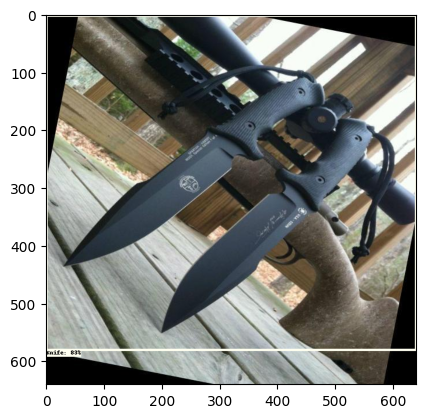

In [109]:
img = cv2.imread(IMAGE_PATH)
image_np = np.array(img)

# convert the array into a tensor
input_tensor = tf.convert_to_tensor(np.expand_dims(image_np, 0), dtype=tf.float32)
# run the detections function on the image
detections = detect_fn(input_tensor)

num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
              for key, value in detections.items()}
detections['num_detections'] = num_detections

# detection_classes should be ints.
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
            image_np_with_detections,
            detections['detection_boxes'],
            detections['detection_classes']+label_id_offset,
            detections['detection_scores'],
            category_index,
            use_normalized_coordinates=True,
            max_boxes_to_draw=8,
            min_score_thresh=0.52,
            agnostic_mode=False)

print(detections['detection_scores'])
plt.imshow(cv2.cvtColor(image_np_with_detections, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
!zip /content/20k20batch0.5IOU.zip {paths['CHECKPOINT_PATH']}

  adding: Tensorflow/workspace/models/my_ssdmobnet/ (stored 0%)


In [ ]:
from google.colab import files

files.download('/content/20k20batch0.5IOU.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!unzip /content/Tensorflow/workspace/pre-trained-models/my_military_model.zip

Archive:  /content/Tensorflow/workspace/pre-trained-models/my_military_model.zip
   creating: my_military_model/checkpoint/
  inflating: my_military_model/checkpoint/checkpoint  
  inflating: my_military_model/checkpoint/ckpt-0.data-00000-of-00001  
  inflating: my_military_model/checkpoint/ckpt-0.index  
  inflating: my_military_model/pipeline.config  
   creating: my_military_model/saved_model/
   creating: my_military_model/saved_model/assets/
 extracting: my_military_model/saved_model/fingerprint.pb  
  inflating: my_military_model/saved_model/saved_model.pb  
   creating: my_military_model/saved_model/variables/
  inflating: my_military_model/saved_model/variables/variables.data-00000-of-00001  
  inflating: my_military_model/saved_model/variables/variables.index  


# 10. Real Time Detections from your Webcam

In [ ]:
!pip uninstall opencv-python-headless -y

In [ ]:
cap = cv2.VideoCapture(0)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

while cap.isOpened():
    ret, frame = cap.read()
    image_np = np.array(frame)

    input_tensor = tf.convert_to_tensor(np.expand_dims(image_np, 0), dtype=tf.float32)
    detections = detect_fn(input_tensor)

    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                  for key, value in detections.items()}
    detections['num_detections'] = num_detections

    # detection_classes should be ints.
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    label_id_offset = 1
    image_np_with_detections = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
                image_np_with_detections,
                detections['detection_boxes'],
                detections['detection_classes']+label_id_offset,
                detections['detection_scores'],
                category_index,
                use_normalized_coordinates=True,
                max_boxes_to_draw=5,
                min_score_thresh=.8,
                agnostic_mode=False)

    cv2.imshow('object detection',  cv2.resize(image_np_with_detections, (800, 600)))

    if cv2.waitKey(10) & 0xFF == ord('q'):
        cap.release()
        cv2.destroyAllWindows()
        break

# 10. Freezing the Graph

In [ ]:
FREEZE_SCRIPT = os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection', 'exporter_main_v2.py ')

In [ ]:
command = "python {} --input_type=image_tensor --pipeline_config_path={} --trained_checkpoint_dir={} --output_directory={}".format(FREEZE_SCRIPT ,files['PIPELINE_CONFIG'], paths['CHECKPOINT_PATH'], paths['OUTPUT_PATH'])

In [ ]:
print(command)

python Tensorflow/models/research/object_detection/exporter_main_v2.py  --input_type=image_tensor --pipeline_config_path=Tensorflow/workspace/models/my_ssdmobnet_640_tuned/pipeline.config --trained_checkpoint_dir=Tensorflow/workspace/models/my_ssdmobnet_640_tuned --output_directory=Tensorflow/workspace/models/my_ssdmobnet_640_tuned/export


In [ ]:
!{command}

In [110]:
from google.colab import files

zip and download the frozen graph

In [ ]:
!zip /content/frozenmodel.zip  {os.path.join(paths['CHECKPOINT_PATH'], 'export')}
files.download('/content/frozenmodel.zip')

zip and download the entire model

In [112]:
!zip /content/mymodel.zip {paths['CHECKPOINT_PATH']}
files.download('/content/mymodel.zip')

  adding: Tensorflow/workspace/models/my_ssdmobnet2_IOU0.5/ (stored 0%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 12. Conversion to TFLite

In [ ]:
TFLITE_SCRIPT = os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection', 'export_tflite_graph_tf2.py ')

In [ ]:
command = "python {} --pipeline_config_path={} --trained_checkpoint_dir={} --output_directory={}".format(TFLITE_SCRIPT ,files['PIPELINE_CONFIG'], paths['CHECKPOINT_PATH'], paths['TFLITE_PATH'])

In [ ]:
print(command)

python Tensorflow\models\research\object_detection\export_tflite_graph_tf2.py  --pipeline_config_path=Tensorflow\workspace\models\my_ssd_mobnet\pipeline.config --trained_checkpoint_dir=Tensorflow\workspace\models\my_ssd_mobnet --output_directory=Tensorflow\workspace\models\my_ssd_mobnet\tfliteexport


In [ ]:
!{command}

In [ ]:
FROZEN_TFLITE_PATH = os.path.join(paths['TFLITE_PATH'], 'saved_model')
TFLITE_MODEL = os.path.join(paths['TFLITE_PATH'], 'saved_model', 'detect.tflite')

In [ ]:
command = "tflite_convert \
--saved_model_dir={} \
--output_file={} \
--input_shapes=1,300,300,3 \
--input_arrays=normalized_input_image_tensor \
--output_arrays='TFLite_Detection_PostProcess','TFLite_Detection_PostProcess:1','TFLite_Detection_PostProcess:2','TFLite_Detection_PostProcess:3' \
--inference_type=FLOAT \
--allow_custom_ops".format(FROZEN_TFLITE_PATH, TFLITE_MODEL, )

In [ ]:
print(command)

tflite_convert --saved_model_dir=Tensorflow\workspace\models\my_ssd_mobnet\tfliteexport\saved_model --output_file=Tensorflow\workspace\models\my_ssd_mobnet\tfliteexport\saved_model\detect.tflite --input_shapes=1,300,300,3 --input_arrays=normalized_input_image_tensor --output_arrays='TFLite_Detection_PostProcess','TFLite_Detection_PostProcess:1','TFLite_Detection_PostProcess:2','TFLite_Detection_PostProcess:3' --inference_type=FLOAT --allow_custom_ops


In [ ]:
!{command}

2021-04-03 11:55:38.653963: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library cudart64_110.dll
2021-04-03 11:55:41.159460: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-04-03 11:55:41.160164: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library nvcuda.dll
2021-04-03 11:55:41.183623: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:2b:00.0 name: GeForce RTX 2070 SUPER computeCapability: 7.5
coreClock: 1.785GHz coreCount: 40 deviceMemorySize: 8.00GiB deviceMemoryBandwidth: 417.29GiB/s
2021-04-03 11:55:41.183649: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library cudart64_110.dll
2021-04-03 11:55:41.187402: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library cublas64_11.dll
202